In [ ]:
#PREVIO A LA PREGUNTA 1

Mounted at /content/drive


<Axes: >

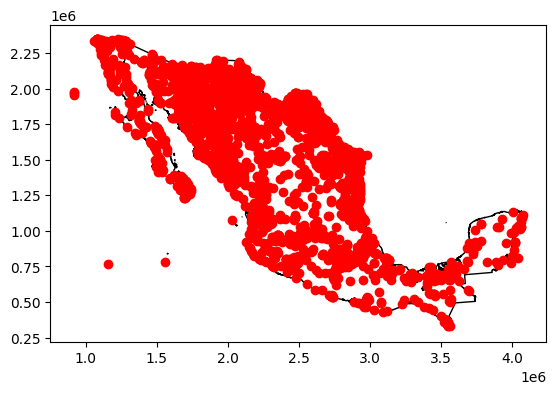

In [ ]:
#CONSEGUIR LOS MAPAS DE PUNTOS
#AEROPUERTO
import os
import geopandas as gpd
import pandas as pd
from google.colab import drive
from IPython.display import display
drive.mount('/content/drive')
shapefile_path = "/content/drive/My Drive/SHAPEFILE/contdv250kgw/contdv250kgw.shp"
mexico = gpd.read_file(shapefile_path)
airports=pd.read_csv("/content/drive/My Drive/SHAPEFILE/Aeropuertos/airports.csv")


keep=['type', 'name', 'latitude_deg', 'longitude_deg',
       'elevation_ft', 'continent', 'iso_country', 'iso_region',
       'municipality']
airports=airports.loc[:,keep]
numeros_airpt=['latitude_deg', 'longitude_deg', 'elevation_ft']
airports[numeros_airpt]=airports[numeros_airpt].apply(pd.to_numeric)
aeropuertos_mex=gpd.GeoDataFrame(airports, geometry=gpd.points_from_xy(airports.longitude_deg, airports.latitude_deg), crs=mexico.crs.to_epsg())
airports_projected_for_filter = aeropuertos_mex.to_crs(mexico.crs)
airports_in_mexico = gpd.sjoin(airports_projected_for_filter, mexico, predicate='within')
filtered_aeropuertos_mex = aeropuertos_mex.loc[airports_in_mexico.index]

mexico6362=mexico.to_crs(6362)
base=mexico6362.plot(color='white', edgecolor='black')
aerop_6362=filtered_aeropuertos_mex.to_crs(6362)
aerop_6362.plot(ax=base, color='red')

In [ ]:
#CONSEGUIR MAPA DE PUNTOS
#PUERTOS MARITIMOS
portsFileLink="https://github.com/CienciaDeDatosEspacial/GeoDataFrame_Analytics/raw/main/data/UpdatedPub150.csv"
infoseaports=pd.read_csv(portsFileLink)

In [ ]:
infoseaports.rename(columns={'Main Port Name':'portName'},inplace=True)
infoseaports=infoseaports.loc[:,['portName', 'Country Code','Latitude', 'Longitude']]

infoseaports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3739 entries, 0 to 3738
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   portName      3739 non-null   object 
 1   Country Code  3739 non-null   object 
 2   Latitude      3739 non-null   float64
 3   Longitude     3739 non-null   float64
dtypes: float64(2), object(2)
memory usage: 117.0+ KB


In [ ]:
#Selecionamos los puertos maritimos de Mexico
seaports_mex=infoseaports[infoseaports['Country Code']=='Mexico']
seaports_mex.head()

,portName,Country Code,Latitude,Longitude
432,San Juan De La Costa,Mexico,24.400000,-110.700000
1027,Ensenada,Mexico,31.866667,-116.633333
1029,Nanchital,Mexico,18.066667,-94.416667
1104,Puerto Madero,Mexico,14.700000,-92.450000
1119,Salina Cruz,Mexico,16.166667,-95.200000


In [ ]:
seaports_mex_gdf = gpd.GeoDataFrame(seaports_mex, geometry=gpd.points_from_xy(seaports_mex.Longitude, seaports_mex.Latitude), crs=mexico.crs.to_epsg())
type(seaports_mex_gdf)

geopandas.geodataframe.GeoDataFrame

In [ ]:
seaports_mex_6362=seaports_mex_gdf.to_crs(6362)
seaports_mex_6362.head()
#los reproyectamos

,portName,Country Code,Latitude,Longitude,geometry
432,San Juan De La Costa,Mexico,24.400000,-110.700000,POINT (1622766.872 1400102.095)
1027,Ensenada,Mexico,31.866667,-116.633333,POINT (1110312.055 2270684.066)
1029,Nanchital,Mexico,18.066667,-94.416667,POINT (3301657.436 696363.442)
1104,Puerto Madero,Mexico,14.700000,-92.450000,POINT (3534131.97 336173.831)
1119,Salina Cruz,Mexico,16.166667,-95.200000,POINT (3228888.129 482014.432)


In [ ]:
type(seaports_mex_6362)

geopandas.geodataframe.GeoDataFrame

<Axes: >

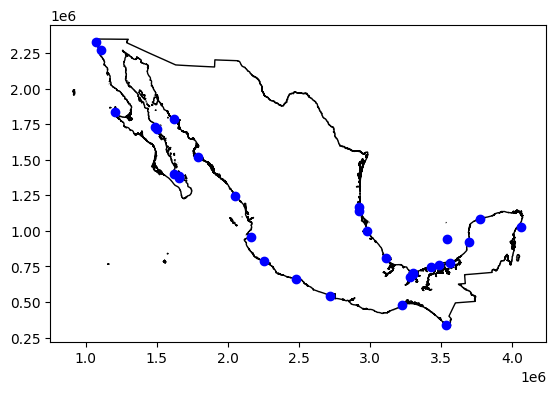

In [ ]:
mexico6362=mexico.to_crs(6362)
base=mexico6362.plot(color='white', edgecolor='black')
seaports_mex_6362.plot(ax=base, color='blue')
#Mapa de Mexico con sus puertos maritimos

<Axes: >

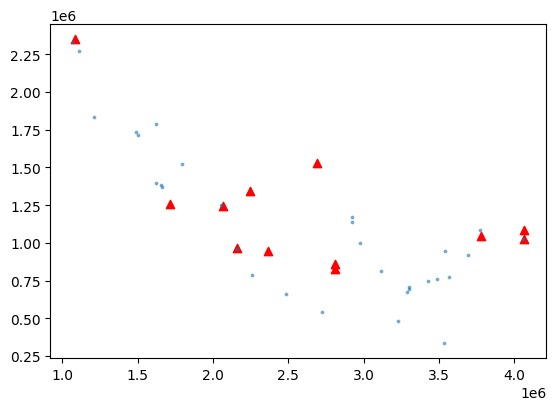

In [ ]:
largeAirports=aerop_6362[aerop_6362['type']=='large_airport']
#seleccionamos un tipo de aeropuerto
largeAirports.reset_index(drop=True, inplace=True)

#proyectamos los puertos maritimos usando como base a los aeropuertos seleccionados
base=largeAirports.plot(color='red',marker="^")
seaports_mex_6362.plot(ax=base,alpha=0.5,markersize=3)

In [ ]:
!pip install folium matplotlib mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 5.3 MB/s eta 0:00:00


PREGUNTA 1

A)Use two maps of points from your country. B)Compute the distance matrix for both maps. C)Select one row of the distance matrix, and plot the two points with the minimal distance on top of the country of your choosing

In [ ]:
seaports_mex_6362.head()

,portName,Country Code,Latitude,Longitude,geometry
432,San Juan De La Costa,Mexico,24.400000,-110.700000,POINT (1622766.872 1400102.095)
1027,Ensenada,Mexico,31.866667,-116.633333,POINT (1110312.055 2270684.066)
1029,Nanchital,Mexico,18.066667,-94.416667,POINT (3301657.436 696363.442)
1104,Puerto Madero,Mexico,14.700000,-92.450000,POINT (3534131.97 336173.831)
1119,Salina Cruz,Mexico,16.166667,-95.200000,POINT (3228888.129 482014.432)


In [ ]:
largeAirports.head()

,type,name,latitude_deg,longitude_deg,elevation_ft,continent,iso_country,iso_region,municipality,geometry
0,large_airport,Cozumel International Airport,20.514922,-86.928538,15.0,NaN,MX,MX-ROO,Cozumel,POINT (4062709.679 1027637.886)
1,large_airport,General Guadalupe Victoria International Airport,24.125468,-104.527938,6104.0,NaN,MX,MX-DUR,Durango,POINT (2244428.234 1345494.944)
2,large_airport,Guadalajara International Airport,20.523342,-103.310108,5016.0,NaN,MX,MX-JAL,Guadalajara,POINT (2363919.298 947002.294)
3,large_airport,Manuel Crescencio Rejón International Airport,20.930485,-89.645462,38.0,NaN,MX,MX-YUC,Mérida,POINT (3777833.47 1046337.156)
4,large_airport,Benito Juárez International Airport,19.435137,-99.071328,7316.0,NaN,MX,MX-DIF,Ciudad de México,POINT (2806634.918 829468.369)


In [ ]:
#Computamos la matriz de distancia entre los puertos maritimos de Mexico(seaports)
#y algunos aeropuertos de Mexico (largeAirporsts)
matrix=seaports_mex_6362.set_index('portName').geometry.apply\
(lambda g: largeAirports.set_index('name').geometry.distance(g)/1000).\
sort_index(axis=0).sort_index(axis=1)
matrix.head()

name,Benito Juárez International Airport,Cancún International Airport,Cozumel International Airport,General Abelardo L. Rodriguez International Airport,General Felipe Ángeles International Airport,General Guadalupe Victoria International Airport,General Rafael Buelna International Airport,Guadalajara International Airport,Los Cabos International Airport,Manuel Crescencio Rejón International Airport,Monterrey International Airport,Puerto Vallarta International Airport
portName,,,,,,,,,,,,
Acapulco,300.009668,1447.671526,1427.327486,2436.172560,333.091078,933.871862,959.542103,539.548143,1234.657733,1171.411274,985.082999,701.753499
Altamira,359.027190,1140.476352,1146.638959,2184.736951,326.350438,702.973342,862.284620,602.995418,1213.989654,861.780327,428.797200,788.434353
Campeche,891.937200,403.896260,384.168611,2973.572326,885.104175,1510.771263,1660.111532,1330.344491,2008.512254,151.792990,1174.016600,1532.344468
Cayo Arcas Terminal,744.487297,538.996937,527.130695,2829.699088,736.060499,1358.754282,1506.779974,1178.429198,1855.051505,256.980248,1033.611211,1380.169135
Ciudad Del Carmen,761.692373,584.878290,556.679267,2937.065625,760.707537,1439.635686,1571.962002,1214.663089,1914.004365,343.597467,1155.056189,1417.094496


In [ ]:
#Seleccionamos una fila de la matrix
fila=matrix.iloc[0]
fila.head()

,Acapulco
name,
Benito Juárez International Airport,300.009668
Cancún International Airport,1447.671526
Cozumel International Airport,1427.327486
General Abelardo L. Rodriguez International Airport,2436.172560
General Felipe Ángeles International Airport,333.091078


In [ ]:
#La distancia mínima entre el seaport Acapulco y un aeropuerto
dist_min_puntos=fila.idxmin()
dist_min_puntos

'Benito Juárez International Airport'

<Axes: >

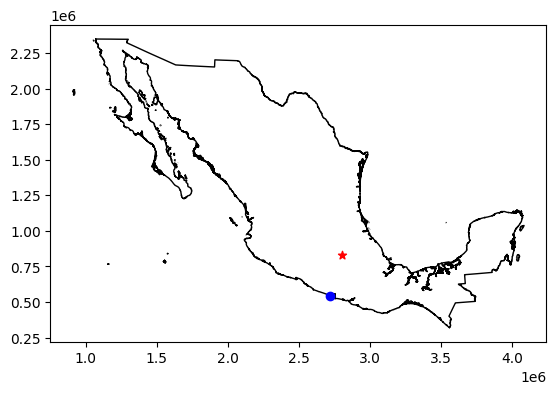

In [ ]:
#Proyectamos la distancia mínima
base=mexico6362.plot(color='white', edgecolor='black')
seaports_mex_6362[seaports_mex_6362['portName'] == 'Acapulco'].plot(ax=base, color='blue', marker='o')
largeAirports[largeAirports['name'] == dist_min_puntos].plot(ax=base, color='red', marker='*')

In [ ]:
base=seaports_mex_6362[seaports_mex_6362['portName'] == 'Acapulco'].explore(color='purple', marker_kwds=dict(radius=10)) #tomamos como base a Acapulco

largeAirports[largeAirports['name'] == dist_min_puntos].explore(m=base, color='red', marker_kwds=dict(radius=10)) #aeropuerto mas cercano a Acapulto

PREVIO A LA PREGUNTA 2

In [ ]:
!pip install fiona

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 123.5 MB/s eta 0:00:00


In [ ]:
shapefile_path = "/content/drive/MyDrive/SHAPEFILE/MAPA6362.gpkg"
from  fiona import listlayers
listlayers(shapefile_path)

['México',
 'Estados de México',
 'Municipios de México',
 'Ríos de México',
 'Estados_de_México',
 'Municipalidades_de_México',
 'aeropuerto',
 'Aereopuertos de Mexico',
 'aaeropuertointento']

In [ ]:
#Mapa de lineas (Rios de Mexico)
Rios=gpd.read_file(shapefile_path,layer='Ríos de México')

EJERCICIO 2

Use a map of points and a map of lines from your country.

Compute the distance matrix for both.

Select one line of the distance matrix, and plot the closests and the farthest point to that line.

In [ ]:
Rios.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2234 entries, 0 to 2233
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   FNODE_    2234 non-null   int64   
 1   TNODE_    2234 non-null   int64   
 2   LPOLY_    2234 non-null   int64   
 3   RPOLY_    2234 non-null   int64   
 4   LENGTH    2234 non-null   float64 
 5   COV_      2234 non-null   int64   
 6   COV_ID    2234 non-null   int64   
 7   NOMBRES   582 non-null    object  
 8   geometry  2234 non-null   geometry
dtypes: float64(1), geometry(1), int64(6), object(1)
memory usage: 157.2+ KB


In [ ]:
Rios.dropna(inplace=True)

In [ ]:
distanceMatrixKM_riv_air=Rios.set_index('NOMBRES').geometry.apply\
(lambda g: largeAirports.set_index('name').geometry.distance(g)/1000).\
sort_index(axis=0).sort_index(axis=1)
distanceMatrixKM_riv_air #Matriz con las distancias de cada aeropuerto con cada río

name,Benito Juárez International Airport,Cancún International Airport,Cozumel International Airport,General Abelardo L. Rodriguez International Airport,General Felipe Ángeles International Airport,General Guadalupe Victoria International Airport,General Rafael Buelna International Airport,Guadalajara International Airport,Los Cabos International Airport,Manuel Crescencio Rejón International Airport,Monterrey International Airport,Puerto Vallarta International Airport
NOMBRES,,,,,,,,,,,,
A. Alamos,1244.767837,2287.881034,2302.410690,1000.630406,1227.792932,487.518091,427.021477,843.485115,358.872781,2022.847588,857.522507,713.816263
A. Ballenas,1292.290887,2450.402408,2457.989365,1129.665872,1282.849189,617.660977,453.276932,843.057805,126.964982,2173.264372,1075.591885,660.179863
A. Baroten,1218.344428,2266.951093,2280.923453,1066.985599,1201.262794,460.703212,403.545164,818.756607,345.245778,2000.780636,840.047138,691.748270
A. Blanco,518.347853,1320.811277,1334.149105,1909.732722,486.422183,465.609534,652.013756,525.901967,999.764276,1054.448037,183.032359,664.248183
A. Cabrera,1186.224588,2240.885335,2254.666664,1107.012632,1169.530735,430.685215,368.052189,783.955417,333.001912,1974.344282,815.560199,656.040741
...,...,...,...,...,...,...,...,...,...,...,...,...
R. la Culebra,320.962245,1600.315614,1591.674640,2068.322539,329.102760,574.910948,592.076210,171.648471,882.124227,1313.460401,735.136938,350.505705
R. lazos,590.406199,1685.603046,1692.443417,1663.536896,570.742566,131.522464,284.653260,291.964090,635.533576,1407.596842,417.602305,344.786145
R. verde,1289.357071,2230.689712,2250.133053,960.451810,1267.591675,534.876639,558.514515,940.231038,578.179094,1977.298409,788.595836,849.617326


In [ ]:
#quieremos una fila de la matrix

fila_Canas=distanceMatrixKM_riv_air.loc['R.Canas'].sort_values()
fila_Canas

,R.Canas
name,
General Rafael Buelna International Airport,86.183663
General Guadalupe Victoria International Airport,173.839472
Puerto Vallarta International Airport,201.633902
Guadalajara International Airport,310.367930
Los Cabos International Airport,419.617803
Monterrey International Airport,634.224019
General Felipe Ángeles International Airport,730.266149
Benito Juárez International Airport,741.270676
General Abelardo L. Rodriguez International Airport,1557.281292


In [ ]:
#aeropuerto mas cercano al río
aerop_close=fila_Canas.idxmin()
aerop_close


'General Rafael Buelna International Airport'

In [ ]:
#aeropuerto más lejano al río
aerop_far=fila_Canas.idxmax()
aerop_far

'Cozumel International Airport'

<Axes: >

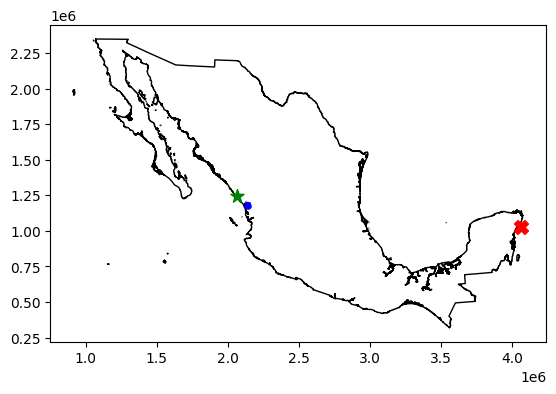

In [ ]:
#Usamos plot para mostrar el punto mas lejano y cercano
base=mexico6362.plot(color='white', edgecolor='black')
Rios[Rios['NOMBRES'] == 'R.Canas'].plot(ax=base, color='blue', linewidth=4)
largeAirports[largeAirports['name'] == aerop_close].plot(ax=base, color='green', marker='*', markersize=100)

largeAirports[largeAirports['name'] == aerop_far].plot(ax=base, color='red', marker='X', markersize=100)

In [ ]:
#Tambien podemos mostrar los puntos usando explore
base= largeAirports[largeAirports['name'] == aerop_close].explore(color='purple', marker_kwds=dict(radius=10)) #tomamos como base el aeropuerto mas cercano al río

largeAirports[largeAirports['name'] == aerop_far].explore(m=base, color='red', marker_kwds=dict(radius=10)) #aeropuerto mas lejano al rio

Rios[Rios.NOMBRES.str.contains('Canas')].explore(m=base, color='blue')#río que seleccionamos

PREGUNTA 3


In [ ]:
#a)Create a HULL for some set of line map.

In [ ]:
Rios.head()

,FNODE_,TNODE_,LPOLY_,RPOLY_,LENGTH,COV_,COV_ID,NOMBRES,geometry
4,0,0,0,0,26475.678766,5,5,R. Bravo o Grande del Norte,"LINESTRING (2082127.527 2190850.698, 2093579.3..."
13,0,0,0,0,7572.959387,14,14,R. Bravo o Grande del Norte,"LINESTRING (2131589.714 2139272.086, 2135237.0..."
25,0,0,0,0,9258.807764,26,26,R. Bravo o Grande del Norte,"LINESTRING (2198018.156 2081989.6, 2204844.998..."
46,0,0,0,0,10825.842400,47,47,R. Bravo o Grande del Norte,"LINESTRING (2250306.564 1969443.84, 2253439.91..."
66,0,0,0,0,7225.017265,67,67,R. Bravo o Grande del Norte,"LINESTRING (2345812.884 1900118.722, 2351842.8..."


In [ ]:
#disolver los que pertenecen a un mismo sistema
systems=Rios.dissolve(by='NOMBRES')
systems

,geometry,FNODE_,TNODE_,LPOLY_,RPOLY_,LENGTH,COV_,COV_ID
NOMBRES,,,,,,,,
A. Alamos,"LINESTRING (1827223.452 1597713.219, 1828053.2...",2626,2627,0,0,112126.518570,1815,1733
A. Ballenas,"LINESTRING (1615448.003 1337202.901, 1615650.9...",3051,3052,0,0,23444.916115,2229,2082
A. Baroten,"LINESTRING (1829698.577 1582451.727, 1830801.3...",856,857,0,0,24556.034866,1182,946
A. Blanco,"LINESTRING (2768259.317 1350673.637, 2766344.9...",2612,2613,0,0,67200.850123,1797,578
A. Cabrera,"MULTILINESTRING ((1857380.806 1530778.593, 185...",1310,1312,0,0,24406.014760,1294,944
...,...,...,...,...,...,...,...,...
R. la Culebra,"LINESTRING (2471140.017 765900.302, 2471146.66...",0,0,0,0,65730.623333,2196,1947
R. lazos,"LINESTRING (2383841.249 1241566.649, 2381243.5...",967,968,0,0,50216.582547,1878,1079
R. verde,"LINESTRING (1919940.263 1871845.167, 1920952.3...",0,0,0,0,95524.412166,1709,1728


In [ ]:
# formatear
systems.reset_index(drop=False,inplace=True)
systems

,NOMBRES,geometry,FNODE_,TNODE_,LPOLY_,RPOLY_,LENGTH,COV_,COV_ID
0,A. Alamos,"LINESTRING (1827223.452 1597713.219, 1828053.2...",2626,2627,0,0,112126.518570,1815,1733
1,A. Ballenas,"LINESTRING (1615448.003 1337202.901, 1615650.9...",3051,3052,0,0,23444.916115,2229,2082
2,A. Baroten,"LINESTRING (1829698.577 1582451.727, 1830801.3...",856,857,0,0,24556.034866,1182,946
3,A. Blanco,"LINESTRING (2768259.317 1350673.637, 2766344.9...",2612,2613,0,0,67200.850123,1797,578
4,A. Cabrera,"MULTILINESTRING ((1857380.806 1530778.593, 185...",1310,1312,0,0,24406.014760,1294,944
...,...,...,...,...,...,...,...,...,...
385,R. la Culebra,"LINESTRING (2471140.017 765900.302, 2471146.66...",0,0,0,0,65730.623333,2196,1947
386,R. lazos,"LINESTRING (2383841.249 1241566.649, 2381243.5...",967,968,0,0,50216.582547,1878,1079
387,R. verde,"LINESTRING (1919940.263 1871845.167, 1920952.3...",0,0,0,0,95524.412166,1709,1728
388,R.Canas,"LINESTRING (2126384.075 1179539.954, 2129075.6...",2658,2659,0,0,62309.980888,1835,2507


<Axes: >

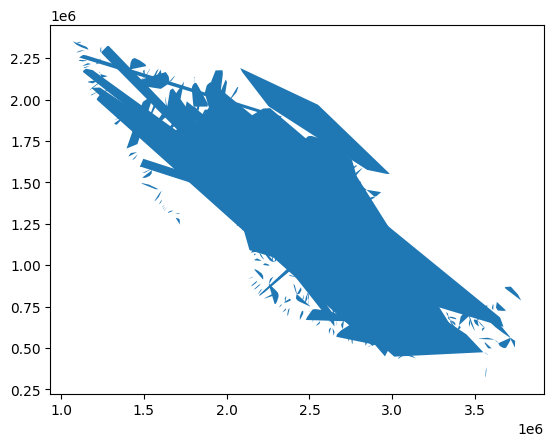

In [ ]:
#creando convex hulls para los sistemas
systems.convex_hull.plot()

In [ ]:
systems_hulls = systems.copy()
systems_hulls = systems_hulls.set_geometry('geometry')
systems_hulls.crs = 'EPSG:6362'
systems_hulls

,NOMBRES,geometry,FNODE_,TNODE_,LPOLY_,RPOLY_,LENGTH,COV_,COV_ID
0,A. Alamos,"LINESTRING (1827223.452 1597713.219, 1828053.2...",2626,2627,0,0,112126.518570,1815,1733
1,A. Ballenas,"LINESTRING (1615448.003 1337202.901, 1615650.9...",3051,3052,0,0,23444.916115,2229,2082
2,A. Baroten,"LINESTRING (1829698.577 1582451.727, 1830801.3...",856,857,0,0,24556.034866,1182,946
3,A. Blanco,"LINESTRING (2768259.317 1350673.637, 2766344.9...",2612,2613,0,0,67200.850123,1797,578
4,A. Cabrera,"MULTILINESTRING ((1857380.806 1530778.593, 185...",1310,1312,0,0,24406.014760,1294,944
...,...,...,...,...,...,...,...,...,...
385,R. la Culebra,"LINESTRING (2471140.017 765900.302, 2471146.66...",0,0,0,0,65730.623333,2196,1947
386,R. lazos,"LINESTRING (2383841.249 1241566.649, 2381243.5...",967,968,0,0,50216.582547,1878,1079
387,R. verde,"LINESTRING (1919940.263 1871845.167, 1920952.3...",0,0,0,0,95524.412166,1709,1728
388,R.Canas,"LINESTRING (2126384.075 1179539.954, 2129075.6...",2658,2659,0,0,62309.980888,1835,2507


In [ ]:
#b)Compute the distance matrix between the HULLS and a map of points.

In [ ]:
#se observan valores duplicados sólo en aeropuertos, por lo que no podremos hacer la matriz de distancia.
aerop_6362['name'].duplicated().any()

np.True_

In [ ]:
#para no mover nada del original, se trabajara con la copia de aerop6362
copia=aerop_6362.copy()
copia = copia.drop_duplicates(subset='name')

In [ ]:
#la matriz de distancia
# Restablecer el índice para asegurar que sea único antes de establecer 'name' como índice
distanceMatrixKM_sysHull_air = systems_hulls.set_index('NOMBRES').geometry.apply\
(lambda g: copia.set_index('name').geometry.distance(g)/1000).\
sort_index(axis=0).sort_index(axis=1)

distanceMatrixKM_sysHull_air

name,(Old) Rancho Oaxaca Airport,33rd Infantry Battalion Heliport,8 de Mayo Airstrip,AVE Arandas Helipad,Aboreachi Airport,Abraham González International Airport,Acaponeta Airport,Acapulco ISSSTE Regional Hospital Helliport,Acatita Airport,Acebuches Airport,...,Zapotiltic - Tuxpan Airport,Zarupa Airstrip,Zimas Heliport,Zongozotla Heliport,Zoquipan Airstrip,Álamos Airport,Álamos de Márquez Airport,Ángeles Hospital Helipad,Ébano Airport,Úrsulo Galván Airstrip
NOMBRES,,,,,,,,,,,,,,,,,,,,,
A. Alamos,407.717139,541.056452,327.959006,894.320054,130.809888,550.036667,539.105025,1388.147822,129.622790,577.668665,...,920.096386,88.757301,829.573427,1321.598382,635.828444,13.741184,543.212027,905.621995,1137.719876,213.911846
A. Ballenas,758.753755,751.463521,546.211624,921.182804,478.674981,939.077906,557.432160,1368.227640,298.706392,898.553374,...,889.623386,392.429976,1043.683932,1397.767617,658.636985,373.990347,886.399647,1000.500968,1262.131157,447.356770
A. Baroten,500.899396,521.017945,398.670461,868.661531,159.520328,636.213402,514.939829,1363.210594,107.307414,598.281194,...,896.249570,78.494392,811.536618,1294.814991,610.972913,96.151224,576.014776,878.812250,1112.759834,280.738496
A. Blanco,1158.604717,378.569868,1252.243429,449.986828,810.251057,1048.861289,586.609293,797.234242,827.161649,542.133806,...,610.275275,830.368612,175.022413,488.713717,524.745680,958.206363,621.378214,242.252769,234.501915,1151.107595
A. Cabrera,520.511633,495.509811,436.489844,826.167236,151.642332,641.907443,467.741965,1317.836585,57.649670,581.231261,...,848.112438,64.525506,786.793320,1261.068243,565.647638,125.499910,561.937436,846.040440,1084.526287,319.446180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R. la Culebra,1428.412404,687.250616,1400.907340,147.139662,1000.782894,1417.538634,477.580203,341.324857,886.806475,976.715873,...,126.668435,967.304242,712.084103,467.344078,379.047471,1088.508914,1041.992448,327.194946,501.153668,1283.273158
R. lazos,976.909641,233.036664,990.934094,283.895518,561.582271,953.670902,222.373425,779.386327,504.988891,532.945191,...,394.025551,548.230853,385.193938,660.828182,185.312029,677.912492,590.101915,245.385113,496.955551,878.083922
R. verde,238.166849,510.010606,332.188344,970.311593,108.020653,346.785772,655.434529,1472.364579,305.429882,465.765920,...,1029.465771,177.418170,766.033155,1342.498096,736.859482,163.235798,419.354421,931.869120,1130.830051,273.880195


In [ ]:
#diferencias minimas
mins=distanceMatrixKM_sysHull_air.idxmin(axis="columns")
mins

,0
NOMBRES,
A. Alamos,El Fuerte Airport
A. Ballenas,El Quelele Airport
A. Baroten,El Fuerte Airport
A. Blanco,Aramberri Airport
A. Cabrera,Portugués de Gálvez Airport
...,...
R. la Culebra,Los Barajas Airport
R. lazos,"Aeródromo de ""Ganadería Valparaíso"""
R. verde,Arisiachi Airport


In [ ]:
#c)Plot the HULLS and the points. Show the closest and farthest points to the HULL.

In [ ]:
base=systems_hulls.explore()
copia[copia.name.isin(mins)].explore(m=base,color='red',marker_kwds=dict(radius=10)) #más cercanos a cada sistema
copia[~copia.name.isin(mins)].explore(m=base,color='blue',marker_kwds=dict(radius=5)) #más lejanos a cada sistema

In [ ]:
#tomando un sistema fluvial en específico, "A.Alamos"
# crear un mapa base con el hull del sistema
hull_aa = systems_hulls[systems_hulls['NOMBRES'] == 'A. Alamos']
base = hull_aa.explore(color='green', style_kwds=dict(fillOpacity=0.2))
#Obtener el nombre del aeropuerto más cercano
aeropuerto_cercano = mins['A. Alamos']
#Mostrar el aeropuerto más cercano en rojo
copia[copia['name'] == aeropuerto_cercano].explore(
    m=base,
    color='red',
    marker_kwds=dict(radius=10)
)

#Mostrar los demás aeropuertos en azul
copia[copia['name'] != aeropuerto_cercano].explore(
    m=base,
    color='blue',
    marker_kwds=dict(radius=5)
)

PREGUNTA 4

In [ ]:
#Select a line map and a point one.

#Get the buffer for the lines, select a distance.

#Keep the points that are within the buffer (you might need to play with differn distances until you show something interesting.

In [ ]:
distanceMatrixKM_riv_air=Rios.set_index('NOMBRES').geometry.apply\
(lambda g: largeAirports.set_index('name').geometry.distance(g)/1000).\
sort_index(axis=0).sort_index(axis=1)

In [ ]:
print(Rios['NOMBRES'].unique())

['R. Bravo o Grande del Norte' 'A. Ocoroni' 'A. Cerro Gordo' 'R. Colorado'
 'A. San Fernando' 'A. Santa Catarina' 'A. Jaraguay' 'A. Delfin'
 'R. San Andres' 'A. Santa Isabel' 'A. Calamajue' 'A. Zamora'
 'A. El Camelo' 'R. Hardy' 'R. Santa Catarina' 'R. Tijuana' 'R. Guadalupe'
 'R. Sto. Tomas' 'A. Grande' 'A. Taraisa' 'A. Sta. Ana' 'R. San Ignacio'
 'A. San Benito' 'A. San Jose Gracia' 'R. San Gregorio' 'A. La Purisima'
 'A. San Venancio' 'A. Santo Domingo' 'A. San Luis' 'A. Salado' 'A. Malva'
 'A. Carrizal' 'A. Rivera' 'R. Sonoita' 'R. Concepcion' 'A. El Coyote'
 'R. El Coyote' 'A. El Tren' 'R. Seco' 'R. Altar' 'A. Cocospera'
 'A. Tezota' 'R. Bacabachic' 'A. del Carrizo' 'A. El Cajonzito'
 'R. Sonora' 'R. Zanjon' 'R. San Miguel' 'A. La Junta' 'R. Guaymas'
 'R. Matape' 'R. Yaqui' 'A. Machomabampo' 'A. Sahuraral' 'R. Tecoripa'
 'R.Chico' 'R. Chico' 'A. La Trinidad' 'R. Bacanora' 'R. Moctezuma'
 'R. Bavispe' 'R. Mulalos' 'A. de Nacalli' 'R. Bapepito' 'A. Cajon Bonito'
 'A. Cocoraque' 'R. 

In [ ]:
distanceMatrixKM_riv_air.loc['R. San Lorenzo'].min()

159.09472240460212

In [ ]:
minMTS=distanceMatrixKM_riv_air.loc['R. San Lorenzo'].min()*1000
Rios[Rios.NOMBRES=='R. San Lorenzo'].buffer(distance=minMTS)

,0
1827,"POLYGON ((1820052.164 1454900.302, 1829487.312..."


In [ ]:
buff_San_Lorenzo=Rios[Rios.NOMBRES=='R. San Lorenzo'].buffer(distance=minMTS)
buffASbase=buff_San_Lorenzo.explore(color='red')
Rios[Rios.NOMBRES=='R. San Lorenzo'].explore(m=buffASbase,color='blue',style_kwds={'weight':0.5})

In [ ]:
smallAirports=aerop_6362[aerop_6362['type']=='small_airport']
Rios[Rios.NOMBRES=='R. San Lorenzo'].explore(m=buffASbase,color='blue',style_kwds={'weight':0.5})
smallAirports.explore(m=buffASbase,color='yellow')

In [ ]:
Rios_dentro_buff=smallAirports.clip(mask=buff_San_Lorenzo)
Rios_dentro_buff

,type,name,latitude_deg,longitude_deg,elevation_ft,continent,iso_country,iso_region,municipality,geometry
46668,small_airport,Mazfly S.C. Airport,23.255225,-106.214995,59.0,NaN,MX,MX-SIN,Mazatlán,POINT (2071091.083 1253686.861)
46432,small_airport,Campo El Patole Airport,23.738610,-106.830833,66.0,NaN,MX,MX-SIN,San Ignacio,POINT (2010239.995 1308876.736)
46091,small_airport,Ejidal Airstrip,23.909576,-106.897357,NaN,NaN,MX,MX-SIN,La Cruz,POINT (2004141.206 1327927.002)
46090,small_airport,Elota Airstrip,23.935466,-106.872801,NaN,NaN,MX,MX-SIN,La Cruz,POINT (2006723.427 1330692.607)
47035,small_airport,Juan Murillo Airport,23.950528,-106.927335,43.0,NaN,MX,MX-SIN,Cruz de Elota,POINT (2001262.069 1332539.419)
...,...,...,...,...,...,...,...,...,...,...
45788,small_airport,El Limon de Badiraguato Airstrip,25.824200,-107.232700,4060.0,NaN,MX,MX-SIN,Badiraguato,POINT (1977898.714 1539980.611)
46213,small_airport,Loma Linda Airstrip,25.840642,-107.322625,2763.0,NaN,MX,MX-SIN,Badiraguato,POINT (1968997.655 1542122.587)
46828,small_airport,El Roble Gordo Airstrip,25.849289,-107.337456,2100.0,NaN,MX,MX-SIN,Badiraguato,POINT (1967554.225 1543130.425)
47550,small_airport,Tecuixiapa Airstrip,25.853054,-107.384566,1893.0,NaN,MX,MX-SIN,Badiraguato,POINT (1962872.48 1543720.972)


In [ ]:
buffASbase=buff_San_Lorenzo.explore(color='red')
Rios_dentro_buff.explore(m=buffASbase,color='blue',style_kwds={'weight':0.5})
Rios_dentro_buff.explore(m=buffASbase,color='orange')

In [ ]:
distanceMatrixKM_riv_air.min(axis=1).min()
MinminMTS_5=5*distanceMatrixKM_riv_air.min(axis=1).min()*1000
Allminbuff=Rios.buffer(distance=MinminMTS_5).explore(color='red')
Rios.explore(m=Allminbuff,color='blue',style_kwds={'weight':0.5})

In [ ]:
RiosAll_buff=Rios.buffer(distance=MinminMTS_5)
RiosAll_buff.explore(color='blue')

In [ ]:
RiosAll_buff=smallAirports.clip(RiosAll_buff)
RiosAll_buff.explore(color='blue')

<Axes: >

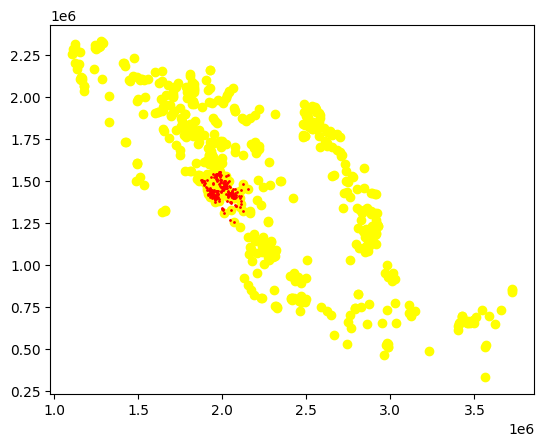

In [ ]:
base=RiosAll_buff.plot(color='yellow')
Rios_dentro_buff.plot(ax=base,color='red', markersize=1)


In [ ]:
base=RiosAll_buff.explore(color='yellow')
Rios_dentro_buff.explore(m=base,color='green')